In [1]:
import cv2
import pandas as pd
import numpy as numpy
import matplotlib.pyplot as plt
from pathlib import Path
import random

In [2]:
DATA_DIR = Path("final_data")

classes = [
    "no_dr",
    "mild",
    "moderate",
    "severe",
    "proliferative_dr"
]

In [3]:
for cls in classes:
    path=DATA_DIR/cls
    images=list(path.glob('*'))
    print(f"{cls:20s} ->{len(images)} images")

no_dr                ->1935 images
mild                 ->393 images
moderate             ->1156 images
severe               ->278 images
proliferative_dr     ->360 images


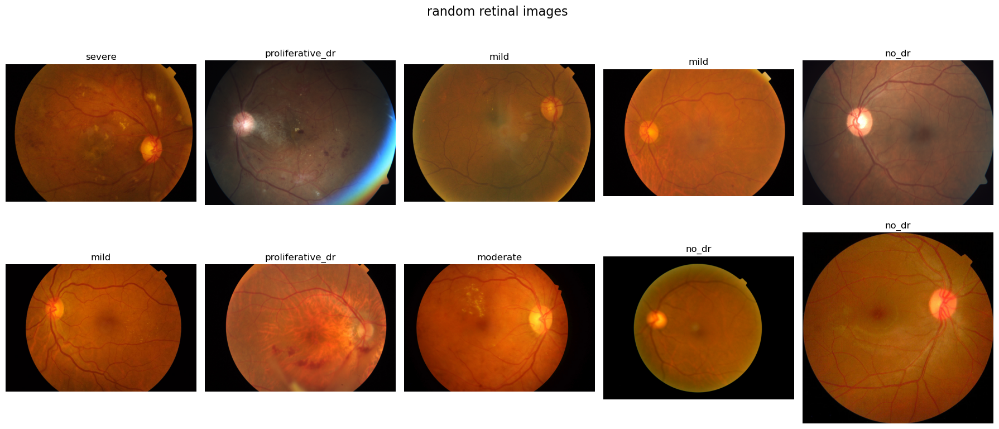

In [4]:
fig,axes=plt.subplots(2,5,figsize=(18,8))

for ax in axes.flat:
    cls=random.choice(classes)

    images=list((DATA_DIR/cls).glob("*"))
    img_path=random.choice(images)

    img=cv2.imread(str(img_path))
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

    ax.imshow(img)
    ax.set_title(cls)
    ax.axis('off')

plt.suptitle("random retinal images ", fontsize=16)
plt.tight_layout()
plt.show()

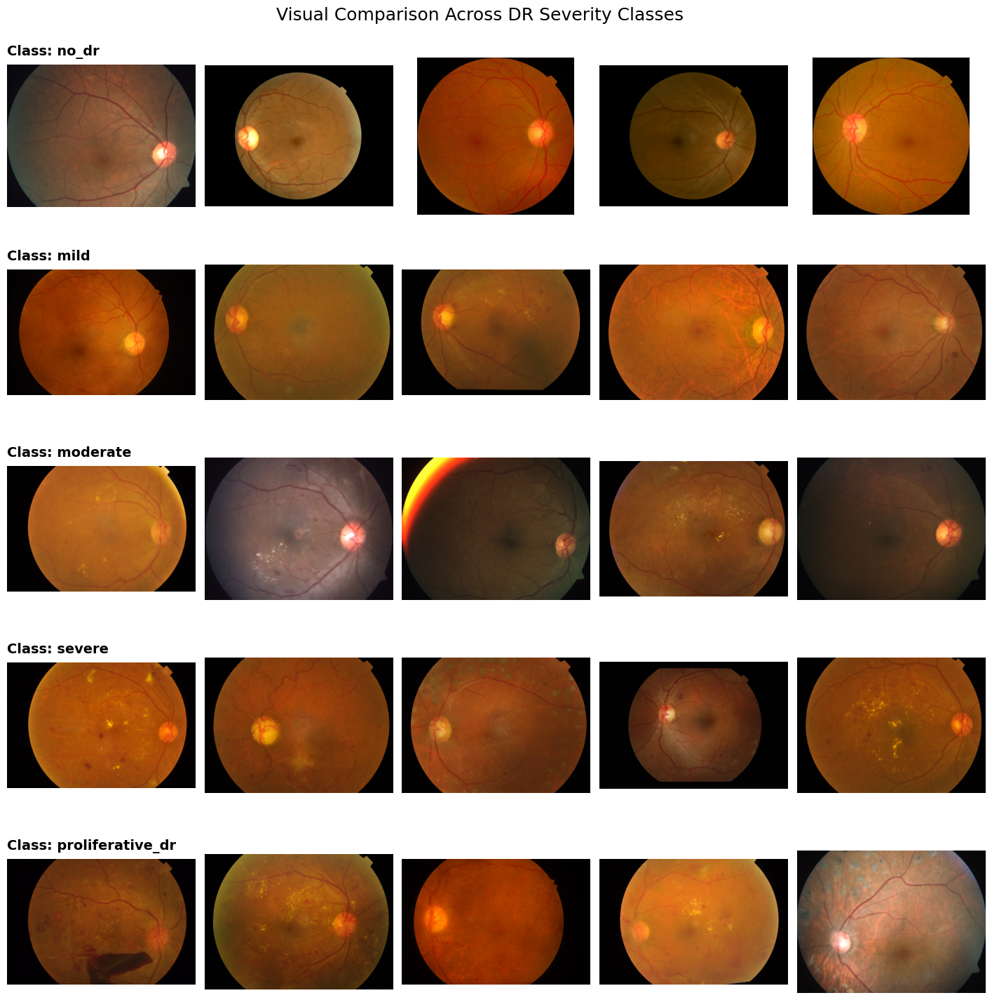

In [5]:
fig, axes = plt.subplots(
    len(classes),
    5,
    figsize=(18, 16)
)

for i, cls in enumerate(classes):

    images = list((DATA_DIR / cls).glob("*"))

    selected = random.sample(
        images,
        min(5, len(images))
    )

    for j, img_path in enumerate(selected):

        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        axes[i, j].imshow(img)
        axes[i, j].axis("off")

    # Class name for each row
    axes[i, 0].set_title(
        f"Class: {cls}",
        fontsize=14,
        fontweight="bold",
        loc="left",
        pad=10
    )

plt.suptitle(
    "Visual Comparison Across DR Severity Classes",
    fontsize=18,
    y=0.995
)

plt.subplots_adjust(
    hspace=0.25,
    wspace=0.05,
    top=0.95
)

plt.show()

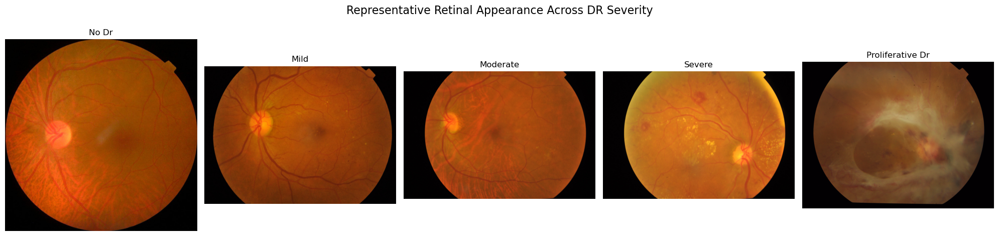

In [6]:
fig, axes = plt.subplots(
    1, 5,
    figsize=(20, 5)
)

for ax, cls in zip(axes, classes):

    images = list((DATA_DIR / cls).glob("*"))
    img_path = random.choice(images)

    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    ax.imshow(img)
    ax.set_title(cls.replace("_", " ").title())
    ax.axis("off")

plt.suptitle(
    "Representative Retinal Appearance Across DR Severity",
    fontsize=16
)

plt.tight_layout()
plt.show()

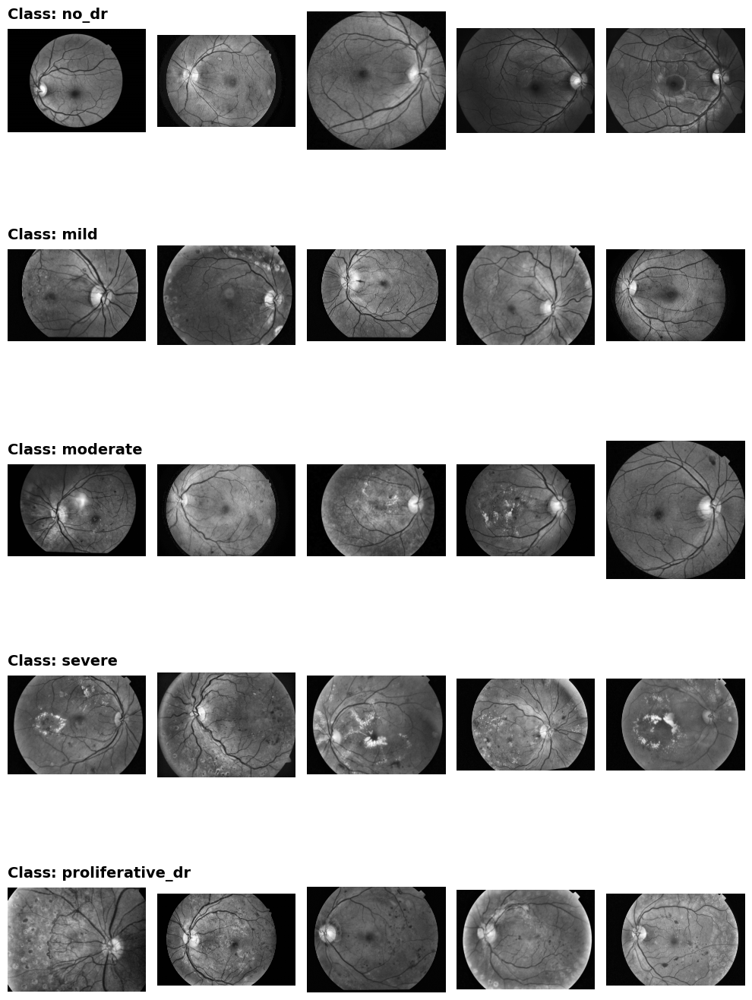

In [24]:
fig, axes = plt.subplots(
    len(classes), 5,
    figsize=(10, 15)
)

for i, cls in enumerate(classes):

    path = list((DATA_DIR / cls).glob('*'))

    selected = random.sample(
        path,
        min(5, len(path))
    )
    for j, imgpath in enumerate(selected):

        img = cv2.imread(str(imgpath))

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        green = img[:, :, 1]
        clahe = cv2.createCLAHE(
            clipLimit=2.0,
            tileGridSize=(8, 8)
        )

        enhanced = clahe.apply(green)

        axes[i, j].imshow(
            enhanced,
            cmap="gray"
        )

        axes[i, j].axis("off")
    axes[i, 0].set_title(
        f"Class: {cls}",
        fontsize=14,
        fontweight="bold",
        loc="left",
        pad=10
    )

plt.tight_layout()
plt.show()

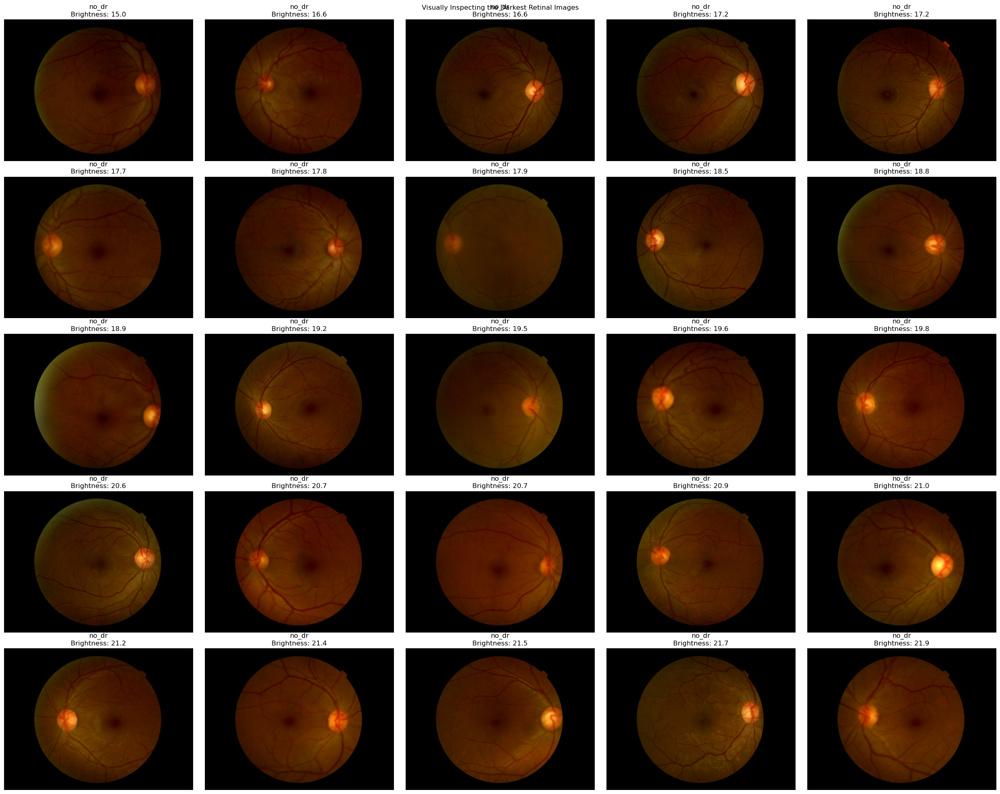

In [34]:
image_df=pd.read_csv('image_df.csv')
darkest = image_df.nsmallest(25, "brightness")

fig, axes = plt.subplots(5, 5, figsize=(25,20))

for ax, (_, row) in zip(axes.flat, darkest.iterrows()):

    img_path = DATA_DIR / row["class"] / row["image"]

    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    ax.imshow(img)

    ax.set_title(
        f'{row["class"]}\n'
        f'Brightness: {row["brightness"]:.1f}'
    )

    ax.axis("off")

plt.suptitle("Visually Inspecting the Darkest Retinal Images")
plt.tight_layout()
plt.show()

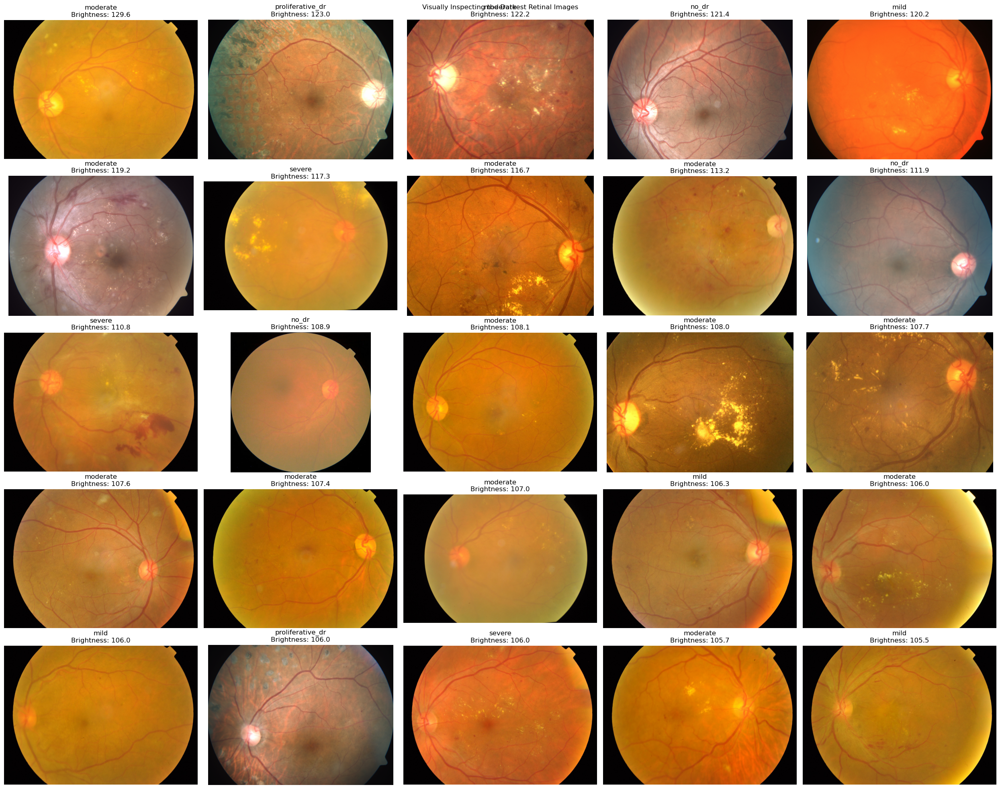

In [36]:
brightest = image_df.nlargest(25, "brightness")

fig, axes = plt.subplots(5, 5, figsize=(25,20))

for ax, (_, row) in zip(axes.flat, brightest.iterrows()):

    img_path = DATA_DIR / row["class"] / row["image"]

    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    ax.imshow(img)

    ax.set_title(
        f'{row["class"]}\n'
        f'Brightness: {row["brightness"]:.1f}'
    )

    ax.axis("off")

plt.suptitle("Visually Inspecting the Darkest Retinal Images")
plt.tight_layout()
plt.show()